In [1]:
import numpy as np
import matplotlib.pyplot as plt
import csv
from algorithms import globals
import os
import numpy as np

num_of_thresholds = 10000



In [2]:
def scale(x):
    a, b = globals.def_clamps
    c, d = globals.original_clamps

    x_scaled = ((x - a) / (b - a)) * (d - c) + c
    return x_scaled

def plot_function(curr_f):
    x = np.linspace(globals.def_clamps[0], globals.def_clamps[1], 100)
    y = np.linspace(globals.def_clamps[0], globals.def_clamps[1], 100)
    X, Y = np.meshgrid(x, y)
    objecitve_f = curr_f["func"](ndim=2)

    Z = np.zeros_like(X)
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            x_clamped = scale(X[i, j])
            y_clamped = scale(Y[i, j])
            Z[i, j] = objecitve_f.evaluate([x_clamped, y_clamped])

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')

    ax.set_title(f"{curr_f['shortname']}")
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('f(X,Y)') 
    ax.set_facecolor('white')

    plt.savefig(f"./charts/cec/{curr_f['shortname']}.png", transparent=False, facecolor='white', dpi=300)

    plt.show()



In [3]:
# logs = [
# # ADAM 0 - 10 (test all versions with the same parameters : 0.01 B1=0.9 B2=0.999)
#     { "name" : "adam clamp lr=0.01 B1=0.8 B2=0.99", "path": "./.archive/Adam/adam_clamp_lr=0.01_B1=0.8_B2=0.99_logs/adam_clamp_lr=0.01_B1=0.8_B2=0.99_records_", "run_path": "./.archive/Adam/adam_clamp_lr=0.01_B1=0.8_B2=0.99_logs/adam_clamp_lr=0.01_B1=0.8_B2=0.99_run_records_"},
#     { "name" : "adam clamp lr=0.001 B1=0.8 B2=0.99", "path": "./.archive/Adam/adam_clamp_lr=0.001_B1=0.8_B2=0.99_logs/adam_clamp_lr=0.001_B1=0.8_B2=0.99_records_", "run_path": "./.archive/Adam/adam_clamp_lr=0.001_B1=0.8_B2=0.99_logs/adam_clamp_lr=0.001_B1=0.8_B2=0.99_run_records_"},
#     { "name" : "adam clamp lr=0.001 B1=0.9 B2=0.999", "path": "./.archive/Adam/adam_clamp_lr=0.001_B1=0.9_B2=0.999_logs/adam_clamp_lr=0.001_B1=0.9_B2=0.999_records_", "run_path": "./.archive/Adam/adam_clamp_lr=0.001_B1=0.9_B2=0.999_logs/adam_clamp_lr=0.001_B1=0.9_B2=0.999_run_records_"},
#     { "name" : "adam clamp lr=0.01 B1=0.9 B2=0.999", "path": "./.archive/Adam/adam_clamp_lr=0.01_B1=0.9_B2=0.999_logs/adam_clamp_lr=0.01_B1=0.9_B2=0.999_records_", "run_path": "./.archive/Adam/adam_clamp_lr=0.01_B1=0.9_B2=0.999_logs/adam_clamp_lr=0.01_B1=0.9_B2=0.999_run_records_"},
   
#     { "name" : "adam clamp lr=0.01 B1=0.9 B2=0.999_t2", "path": "./.archive/Adam/adam_clamp_lr=0.01_B1=0.9_B2=0.999_t2_logs/adam_clamp_lr=0.01_B1=0.9_B2=0.999_t2_records_", "run_path": "./.archive/Adam/adam_clamp_lr=0.01_B1=0.9_B2=0.999_t2_logs/adam_clamp_lr=0.01_B1=0.9_B2=0.999_t2_run_records_"},

#     { "name" : "Adam grad div norm lr=0.01 B1=0.9 B2=0.999", "path": "./.archive/Adam/adam_norm_graddiv_lr=0.01_B1=0.9_B2=0.999_logs/adam_norm_graddiv_lr=0.01_B1=0.9_B2=0.999_records_", "run_path": "./.archive/Adam/adam_norm_graddiv_lr=0.01_B1=0.9_B2=0.999_logs/adam_norm_graddiv_lr=0.01_B1=0.9_B2=0.999_run_records_"},
   
#     { "name" : "Adam lr=0.01 B1=0.9 B2=0.999", "path": "./.archive/Adam/adam_logs_lr=0.01/adam_records_", "run_path": "./.archive/Adam/adam_logs_lr=0.01/adam_run_records_"},
    
#     { "name" : "Adam norm lr=0.01 B1=0.9 B2=0.999", "path": "./.archive/Adam/adam_logs_norm_lr=0.01/adam_records_", "run_path": "./.archive/Adam/adam_logs_norm_lr=0.01/adam_run_records_"},
#     { "name" : "Adam norm lr=0.001 B1=0.8 B2=0.99", "path": "./.archive/Adam/adam_logs_norm_lr=0.001_B1=0.8_B2=0.99/adam_records_", "run_path": "./.archive/Adam/adam_logs_norm_lr=0.001_B1=0.8_B2=0.99/adam_run_records_"},
#     { "name" : "Adam norm lr=0.01 B1=0.8 B2=0.99", "path": "./.archive/Adam/adam_logs_norm_lr=0.01_B1=0.8_B2=0.99/adam_records_", "run_path": "./.archive/Adam/adam_logs_norm_lr=0.01_B1=0.8_B2=0.99/adam_run_records_"},
#     { "name" : "Adam norm lr=0.001 B1=0.9 B2=0.999", "path": "./.archive/Adam/adam_logs_norm_lr=0.001/adam_records_", "run_path": "./.archive/Adam/adam_logs_norm_lr=0.001/adam_run_records_"},

# # CMAES 12 - 14
#     { "name" : "CMAES", "path": "./.archive/CMAES/cmaes_logs/cmaes_records_", "run_path": "./.archive/CMAES/cmaes_logs/cmaes_run_records_"},
    
#     { "name" : "cmaes clamp", "path": "./.archive/CMAES/cmaes_clamp_logs/cmaes_clamp_records_", "run_path": "./.archive/CMAES/cmaes_clamp_logs/cmaes_clamp_run_records_"},
#     { "name" : "cmaes clamp lambd=4m", "path": "./.archive/CMAES/cmaes_clamp_lambd=4m_logs/cmaes_clamp_lambd=4m_records_", "run_path": "./.archive/CMAES/cmaes_clamp_lambd=4m_logs/cmaes_clamp_lambd=4m_run_records_"},   
   

# # ADAGRAD 15 - 21
#     { "name" : "adagrad lr=0.01", "path": "./.archive/Adagrad/adagrad_lr=0.01_logs/adagrad_records_", "run_path": "./.archive/Adagrad/adagrad_lr=0.01_logs/adagrad_run_records_"},

#     { "name" : "adagrad clamp lr=0.1", "path": "./.archive/Adagrad/adagrad_clamp_lr=0.1_logs/adagrad_clamp_lr=0.1_records_", "run_path": "./.archive/Adagrad/adagrad_clamp_lr=0.1_logs/adagrad_clamp_lr=0.1_run_records_"},
#     { "name" : "adagrad clamp lr=0.01", "path": "./.archive/Adagrad/adagrad_clamp_lr=0.01_logs/adagrad_clamp_lr=0.01_records_", "run_path": "./.archive/Adagrad/adagrad_clamp_lr=0.01_logs/adagrad_clamp_lr=0.01_run_records_"},
#     { "name" : "adagrad clamp lr=0.001", "path": "./.archive/Adagrad/adagrad_clamp_lr=0.001_logs/adagrad_clamp_lr=0.001_records_", "run_path": "./.archive/Adagrad/adagrad_clamp_lr=0.001_logs/adagrad_clamp_lr=0.001_run_records_"},
#     { "name" : "adagrad clamp lr=0.1 rho=0.1", "path": "./.archive/Adagrad/adagrad_clamp_lr=0.1_rho=0.1_logs/adagrad_clamp_lr=0.1_rho=0.1_records_", "run_path": "./.archive/Adagrad/adagrad_clamp_lr=0.1_rho=0.1_logs/adagrad_clamp_lr=0.1_rho=0.1_run_records_"},
#     { "name" : "adagrad clamp lr=1.0 rho=0.1", "path": "./.archive/Adagrad/adagrad_clamp_lr=1.0_rho=0.1_logs/adagrad_clamp_lr=1.0_rho=0.1_records_", "run_path": "./.archive/Adagrad/adagrad_clamp_lr=1.0_rho=0.1_logs/adagrad_clamp_lr=1.0_rho=0.1_run_records_"},
#     { "name" : "adagrad clamp lr=1.0", "path": "./.archive/Adagrad/adagrad_clamp_lr=1.0_logs/adagrad_clamp_lr=1.0_records_", "run_path": "./.archive/Adagrad/adagrad_clamp_lr=1.0_logs/adagrad_clamp_lr=1.0_run_records_"},

# #BFGS 22 - 23
#     { "name" : "BFGS clamp def", "path": "./.archive/BFGS/BFGS_clamp_def_logs/BFGS_clamp_def_records_", "run_path": "./.archive/BFGS/BFGS_clamp_def_logs/BFGS_clamp_def_run_records_"},
#     { "name" : "BFGS clamp penalty", "path": "./.archive/BFGS/BFGS_clamp_penalty_logs/BFGS_clamp_penalty_records_", "run_path": "./.archive/BFGS/BFGS_clamp_penalty_logs/BFGS_clamp_penalty_run_records_"},
#     { "name" : "L-BFGS-B clamp", "path": "./.archive/BFGS/L_BFGS_B_clamp_logs/L_BFGS_B_clamp_records_", "run_path": "./.archive/BFGS/L_BFGS_B_clamp_logs/L_BFGS_B_clamp_run_records_"},
# #mbien 24 
#     { "name" : "mbien cmaes", "path": "./.archive/mbien_cmaes/mbien_cmaes_logs/mbien_cmaes_records_", "run_path": "./.archive/mbien_cmaes/mbien_cmaes_logs/mbien_cmaes_run_records_"},

# ]

In [4]:
logs = [
    { "name" : "adagrad", "path": "./Adagrad/adagrad_clamp_lr=1.0_rho=0.1_logs/adagrad_clamp_lr=1.0_rho=0.1_records_", "run_path": "./Adagrad/adagrad_clamp_lr=1.0_rho=0.1_logs/adagrad_clamp_lr=1.0_rho=0.1_run_records_"},
    { "name" : "L_BFGS_B", "path": "./BFGS/L_BFGS_B_clamp_logs/L_BFGS_B_clamp_records_", "run_path": "./BFGS/L_BFGS_B_clamp_logs/L_BFGS_B_clamp_run_records_"},
    # { "name" : "nl_shade_no_ret", "path": "./nl_shade/nl_shade_logs/nl_shade_records_", "run_path": "./nl_shade/nl_shade_logs/nl_shade_run_records_"},
    { "name" : "adam", "path": "./Adam/adam_clamp_lr=0.01_B1=0.8_B2=0.99_logs/adam_clamp_lr=0.01_B1=0.8_B2=0.99_records_", "run_path": ".//Adam/adam_clamp_lr=0.01_B1=0.8_B2=0.99_logs/adam_clamp_lr=0.01_B1=0.8_B2=0.99_run_records_"},
    { "name" : "cmaes", "path": "./cmaes/nopop_logs/nopop_records_", "run_path": "./cmaes/nopop_logs/nopop_run_records_"},
    # { "name" : "cmaes", "path": "./.archive/CMAES/cmaes_clamp_lambd=4m_logs/cmaes_clamp_lambd=4m_records_", "run_path": "./.archive/CMAES/cmaes_clamp_lambd=4m_logs/cmaes_clamp_lambd=4m_run_records_"},
    { "name" : "nl_shade", "path": "./nl_shade/nl_shade_returning_logs/nl_shade_returning_records_", "run_path": "./nl_shade/nl_shade_returning_logs/nl_shade_returning_run_records_"},

]

In [5]:
# def get_records(path):

#     if not os.path.exists(path):
#         records = None
#     else:
#         records = []
#         with open(path, mode='r', newline='') as file:
#             reader = csv.DictReader(file)
#             for row in reader:
#                 converted_row = {
#                     key: (float(value.strip('[]')) if key != 'function' else value)
#                     for key, value in row.items()
#                 }
#                 records.append(converted_row)

        

#     return records



def get_records(path):
    if not os.path.exists(path):
        return None
    records = []
    with open(path, mode='r', newline='') as file:
        reader = csv.DictReader(file)
        for row in reader:
            converted_row = {}
            for key, value in row.items():
                if key == 'function':
                    converted_row[key] = value
                else:
                    # konwersja na float
                    val = float(value.strip('[]'))
                    # jeśli zero, zamień na 1e-8
                    if val == 0:
                        val = 1e-8
                    converted_row[key] = val
            records.append(converted_row)
    return records


In [6]:

def calculate_thresholds(algs_run_records):

    all_errors = [
        r['error']
        for records in algs_run_records.values()
        for r in records
    ]

    all_errors = np.array(all_errors)
    all_errors = all_errors[all_errors >= globals.def_smallest_val]

    percentiles = np.linspace(0, 100, num=num_of_thresholds + 1)
    thresholds = np.percentile(all_errors, percentiles)


    # min_error = np.min(all_errors)
    # max_error = np.max(all_errors)

    # min_error = max(min_error, globals.def_smallest_val)

    # thresholds = np.linspace(min_error, max_error, num=num_of_thresholds + 1)

    return thresholds

In [7]:
def ecdf(run_records, thresholds, dim):
    checkpoint_run_errors = {}

    for r in run_records:
        if r['dimension'] != dim:
            continue
        chk = r['checkpoint']
        error = r['error']
            
        if chk not in checkpoint_run_errors:
            checkpoint_run_errors[chk] = []
        checkpoint_run_errors[chk].append(error)

    avg_part_of_thresholds_reached = []
    prev_reached = None

    for chk in globals.def_checkpoints:
        errors = checkpoint_run_errors.get(chk, [])
        if not errors:
            if prev_reached is None:
                avg_part_of_thresholds_reached.append(0)
            else:
                avg_part_of_thresholds_reached.append(np.mean(prev_reached))
            continue

        fractions = []
        for e in errors:
            reached_now = e <= thresholds

            if prev_reached is not None:
                reached_now = np.maximum(prev_reached, reached_now)

            fractions.append(np.sum(reached_now) / len(thresholds))

        avg_fraction = np.mean(fractions)
        avg_part_of_thresholds_reached.append(avg_fraction)

        combined_reached = np.zeros(len(thresholds), dtype=bool)
        for e in errors:
            combined_reached = np.maximum(combined_reached, e <= thresholds)

        if prev_reached is None:
            prev_reached = combined_reached
        else:
            prev_reached = np.maximum(prev_reached, combined_reached)

    return avg_part_of_thresholds_reached



In [8]:
def compare(logs):
    checkpoints = globals.def_checkpoints

    for curr_f in globals.CEC2013:
        plot_function(curr_f)

        algs_run_records = {}
        algs_records = {}

        for algorithm in logs:
            algs_records[algorithm['name']] = get_records(f"{algorithm['path']}{curr_f['shortname']}.csv")
            algs_run_records[algorithm['name']] = get_records(f"{algorithm['run_path']}{curr_f['shortname']}.csv")

        fig, axs = plt.subplots(2, 3, figsize=(20, 12))
        axs = axs.flatten()
        plot_idx = 0

        # ECDF
        ecdf_thresholds = calculate_thresholds(algs_run_records)

        for dim in globals.def_dimensions:
            ax = axs[plot_idx]
            for algorithm_name, run_record in algs_run_records.items():
                y = ecdf(run_record, ecdf_thresholds, dim)
                # ax.plot(globals.def_checkpoints, y, label=algorithm_name, marker='o')
                y_plot = np.clip(y, globals.def_smallest_val, 1-globals.def_smallest_val)
                y_transformed = -np.log10(1 - y_plot)
                ax.plot(globals.def_checkpoints, y_transformed, label=algorithm_name, marker='o')


            ax.set_xlabel('Checkpoint (evaluations)')
            ax.set_ylabel('-log(1 - Fraction reached)')
            ax.set_title(f"{curr_f['shortname']}, ECDF, dim={dim}")
            ax.set_xscale('log')
            # ax.set_ylim([0, 1.05])
            ax.grid(True)
            ax.legend()

            plot_idx += 1

        # Mean + Std
        for dim in globals.def_dimensions:
            ax = axs[plot_idx]
            for algorithm_name, records in algs_records.items():
                means = []
                stds = []

                for checkpoint in checkpoints:
                    if records:
                        mean_vals = [r['mean'] for r in records if r['dimensions'] == dim and r['checkpoint'] == checkpoint]
                        std_vals = [r['std'] for r in records if r['dimensions'] == dim and r['checkpoint'] == checkpoint]
                        means.append(np.mean(mean_vals) if mean_vals else 0)
                        stds.append(np.mean(std_vals) if std_vals else 0)
                    else:
                        means.append(0)
                        stds.append(0)

                ax.plot(checkpoints, means, label=algorithm_name, marker='o')
                ax.fill_between(checkpoints,
                                np.array(means) - np.array(stds),
                                np.array(means) + np.array(stds),
                                alpha=0.2)

            ax.set_xlabel('Checkpoint')
            ax.set_ylabel('Error')
            ax.set_title(f"{curr_f['shortname']}, mean and std, dim={dim}")
            ax.set_xscale('log')
            ax.set_yscale('log')

            ax.legend()
            ax.grid(True)

            plot_idx += 1

        plt.tight_layout()
        plt.savefig(f"./charts/cec/{curr_f['shortname']}_rec.png", transparent=False, facecolor='white', dpi=300)
        plt.show()


skala log y

test wilcocsona ew parach



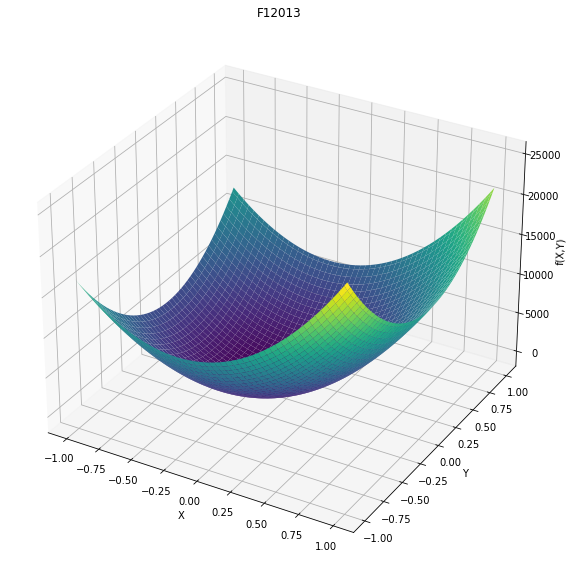

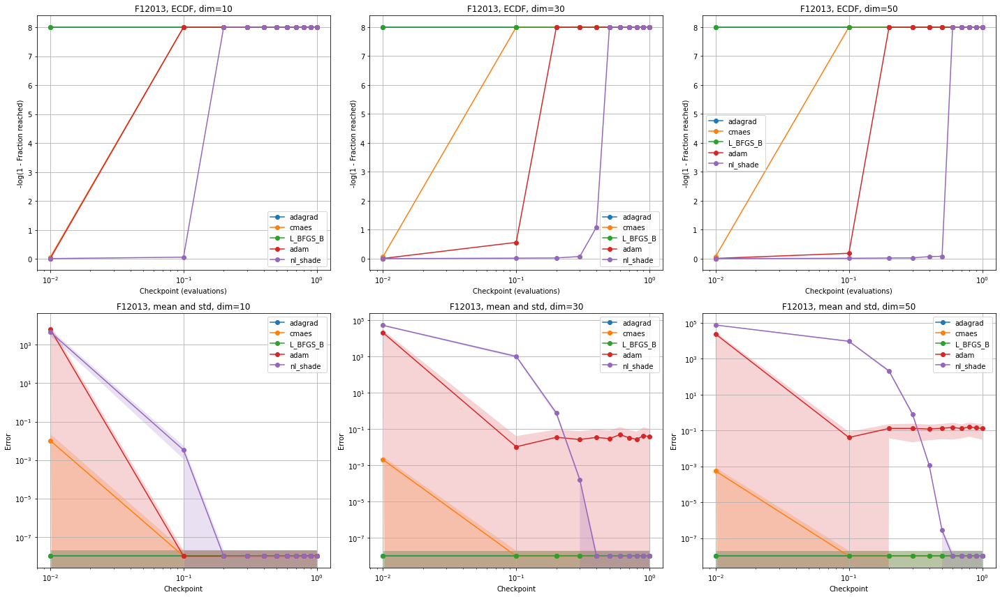

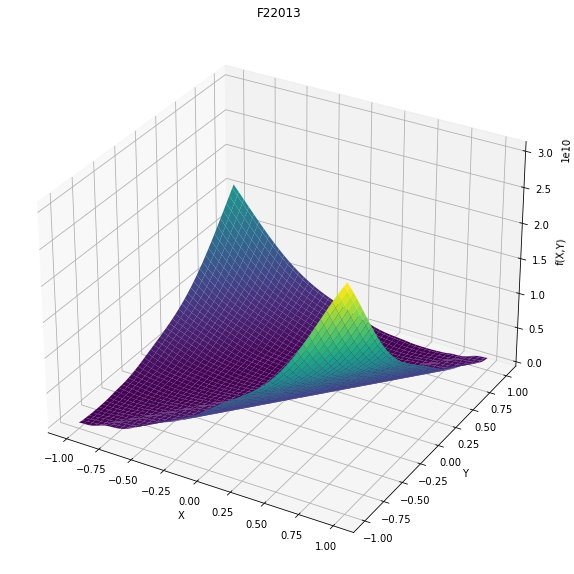

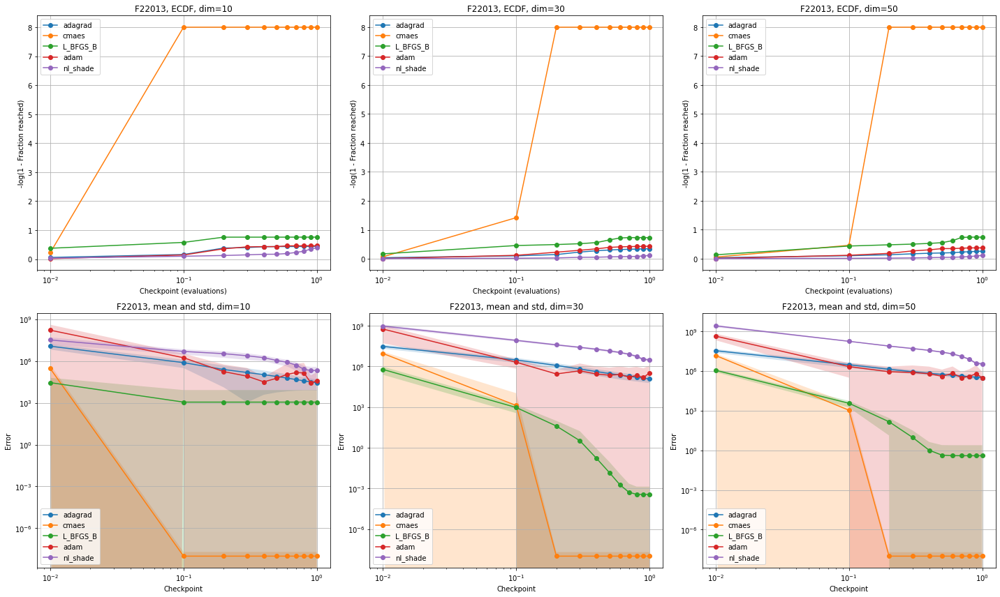

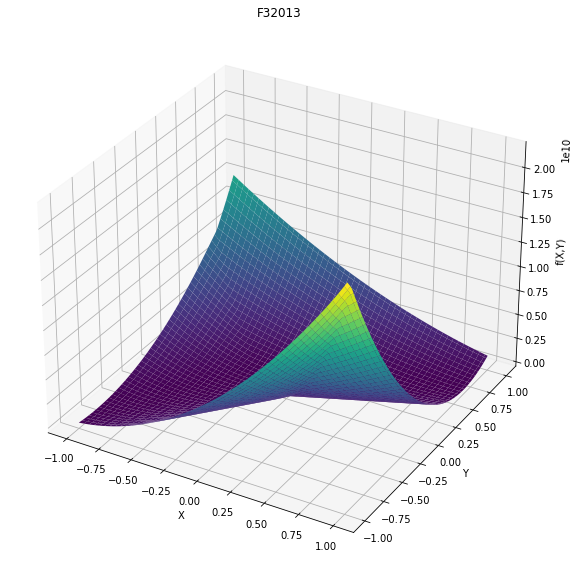

...

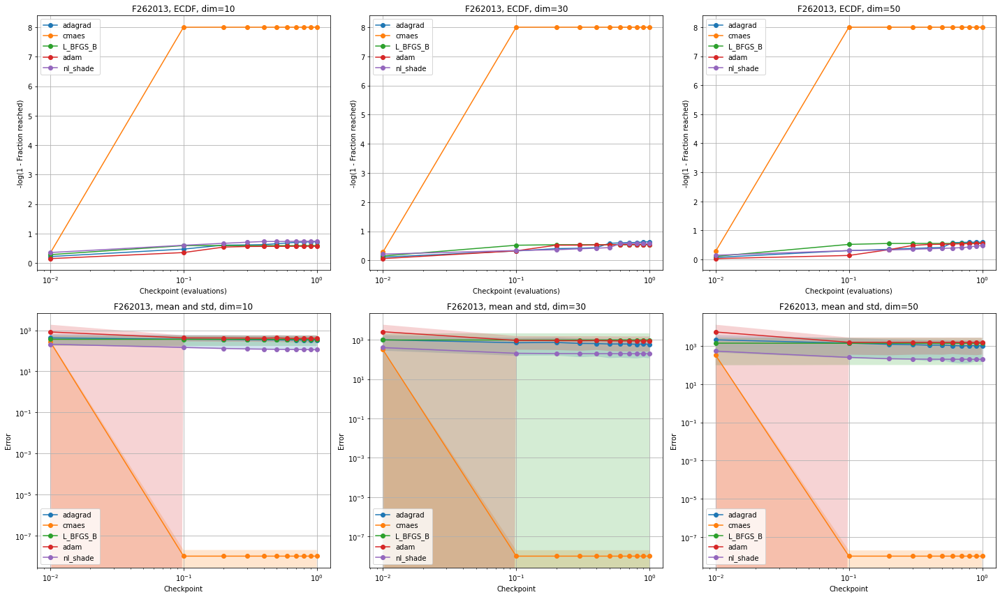

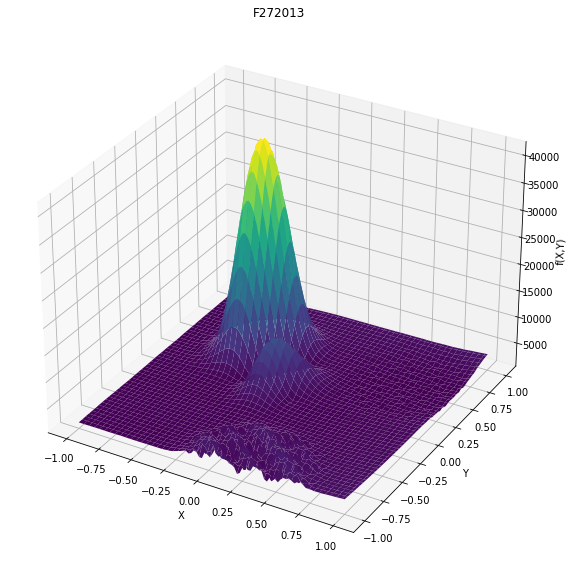

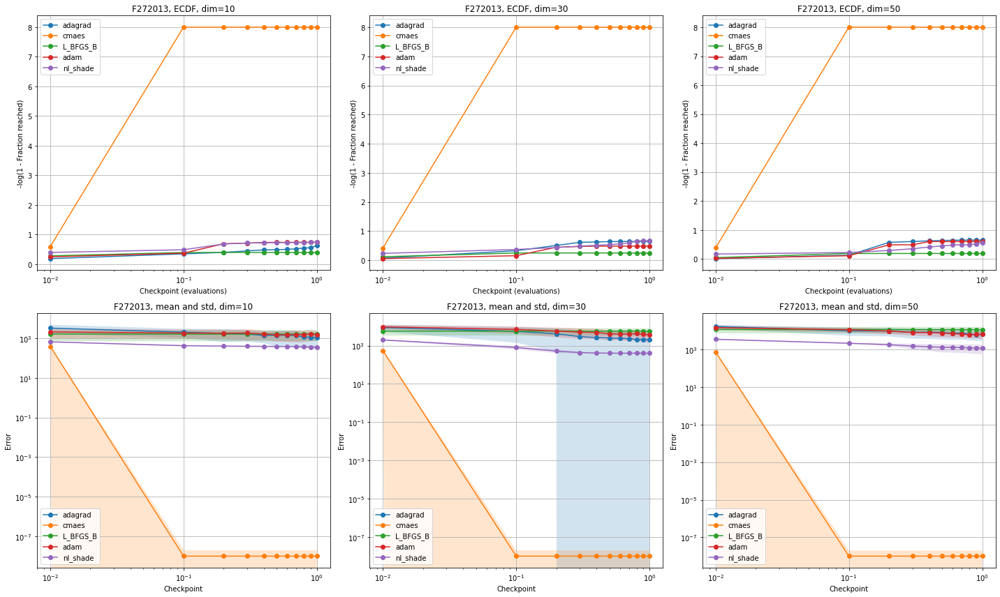

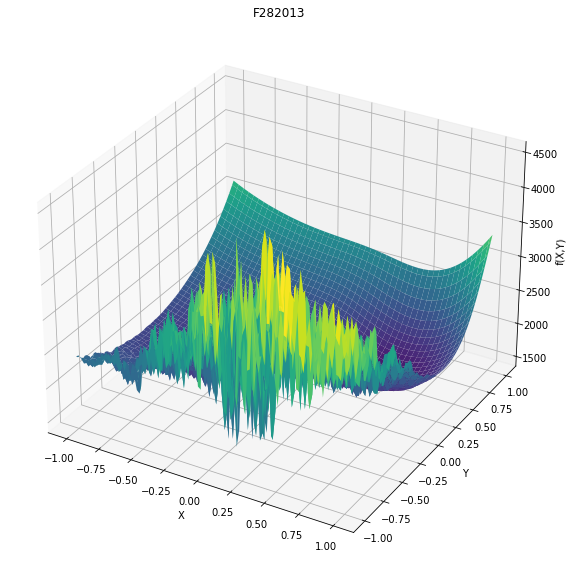

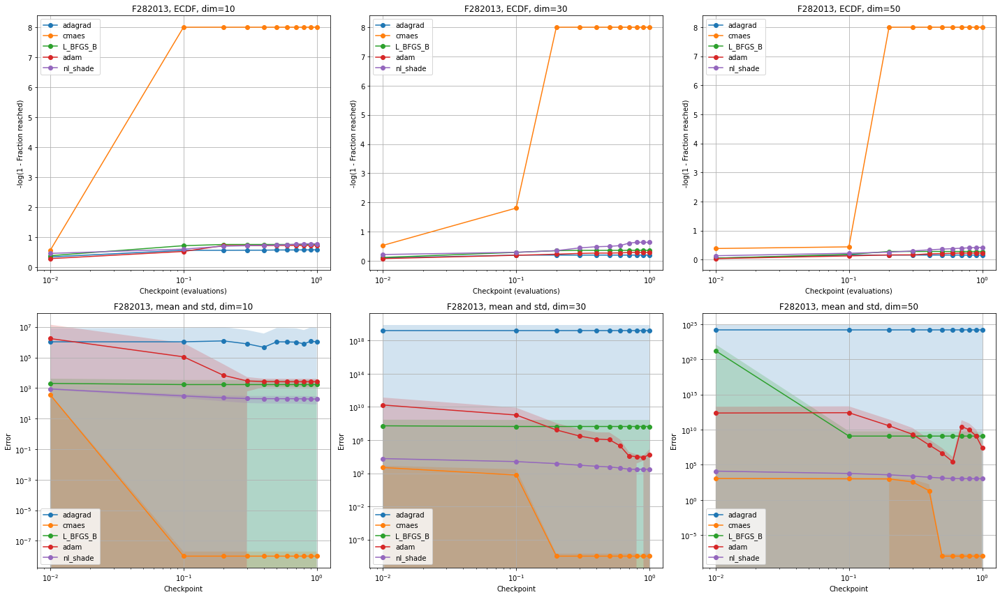

In [9]:
to_compare = []

# indxs = [3, 4, 5, 6, ]
# indxs = [10, 11, 12]
indxs = [0, 3, 1, 2, 4]#1, 3] #, 4, 2]#, 4]#, 2]

for i in indxs:
    to_compare.append(logs[i])

compare(to_compare)